##Ejercicio 8

In [1]:
!pip install -q mediapy

In [2]:
import mediapy as media
url = '/content/WhatsApp Video 2024-04-19 at 11.11.40.mp4'
video = media.read_video(url)
media.show_video(video)

In [3]:
import mediapy as media
url = '/content/WhatsApp Video 2024-04-19 at 11.35.23.mp4'
video = media.read_video(url)
media.show_video(video)

In [4]:
import mediapy as media
url = '/content/WhatsApp Video 2024-04-19 at 11.35.50 (1).mp4'
video = media.read_video(url)
media.show_video(video)

In [5]:
%pip install ultralytics
# Librería mediapy para mostrar videos
%pip install -q mediapy
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 35.9/107.7 GB disk)


In [6]:
import mediapy as media  # Importar la biblioteca mediapy para manejo de medios
import cv2  # Importar OpenCV para el procesamiento de imágenes y videos
import numpy as np
from ultralytics import YOLO

# Load the pre-trained YOLOv8 model
model = YOLO('yolov8n')  # This will automatically download the model weights

# Función para detectar objetos en una imagen:
def detect_objects(new_image, prev_image, **kwargs):
    # Convertir la imagen a float32
    results = model(new_image)

    # Clases de interés para graficar
    classes = kwargs.get('classes', ['dog', 'car'])

    # Iteramos sobre los boung boxes obtenidos
    for box in results[0].boxes:
        # Extrayendo los datos del tensor
        x1, y1, x2, y2, confidence, cls = box.data[0]

        # Obteniendo el nombre de la clase
        class_name = model.names[int(cls)]

        # Parámetros opcionales del bounding box
        color = kwargs.get('color', (0, 255, 0))
        thickness = kwargs.get('thickness', 2)

        if class_name in classes:
            # Dibujar el rectángulo
            cv2.rectangle(new_image, (int(x1), int(y1)), (int(x2), int(y2)), color, thickness)

            # Agregar el texto de la confianza
            confidence_text = f"{class_name}: {confidence:.2f}"
            cv2.putText(new_image, confidence_text, (int(x1), int(y1)-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    return new_image

# Función para procesar un video:
def video_processor(filename_in, filename_out, process_func, max_time=10, **kwargs):
    # Abrir el video de entrada para lectura
    with media.VideoReader(filename_in) as r:
        # Crear un archivo de video de salida
        with media.VideoWriter(filename_out, shape=r.shape, fps=r.fps, bps=r.bps) as w:
            count = 0  # Inicializar contador de fotogramas
            prev_image = None  # Inicializar la imagen previa

            # Iterar sobre cada imagen (fotograma) del video
            for image in r:
                new_image = media.to_uint8(image)  # Convertir la imagen a formato flotante

                # Comprobar si es la primera imagen
                if prev_image is None:
                    prev_image = new_image.copy()

                # Procesar la imagen utilizando la función dada
                processed_image = process_func(new_image, prev_image, **kwargs)

                # Añadir la imagen procesada al video de salida
                w.add_image(processed_image)

                # Actualizar la imagen previa
                prev_image = new_image.copy()

                # Incrementar el contador de fotogramas
                count += 1

                # Detener el proceso si se alcanza el tiempo máximo
                if count >= max_time * r.fps:
                    break

# Nombres de los archivos de video de entrada y salida
filename_in = '/content/WhatsApp Video 2024-04-19 at 11.11.40.mp4'
filename_out = 'highway_bboxes.mp4'
parameters = dict(classes=['dog'])    # [ 'car', 'dog']

# Llamar a la función para procesar el video
video_processor(filename_in, filename_out, detect_objects, 20, **parameters)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=30)


0: 640x384 4 persons, 2 bicycles, 3 cars, 1 motorcycle, 244.6ms
Speed: 17.1ms preprocess, 244.6ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 3 persons, 3 bicycles, 3 cars, 1 motorcycle, 1 truck, 191.2ms
Speed: 3.4ms preprocess, 191.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 6 persons, 2 bicycles, 3 cars, 2 trucks, 154.3ms
Speed: 4.7ms preprocess, 154.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 6 persons, 3 bicycles, 3 cars, 1 motorcycle, 2 trucks, 169.3ms
Speed: 3.6ms preprocess, 169.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 5 persons, 2 bicycles, 1 car, 1 motorcycle, 1 truck, 156.2ms
Speed: 3.4ms preprocess, 156.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 4 persons, 2 bicycles, 1 car, 1 truck, 176.2ms
Speed: 4.2ms preprocess, 176.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 384)

0: 

In [7]:
import mediapy as media  # Importar la biblioteca mediapy para manejo de medios
import cv2  # Importar OpenCV para el procesamiento de imágenes y videos
import numpy as np
from ultralytics import YOLO

# Load the pre-trained YOLOv8 model
model = YOLO('yolov8n')  # This will automatically download the model weights

# Función para detectar objetos en una imagen:
def detect_objects(new_image, prev_image, **kwargs):
    # Convertir la imagen a float32
    results = model(new_image)

    # Clases de interés para graficar
    classes = kwargs.get('classes', ['motorcycle', 'car'])

    # Iteramos sobre los boung boxes obtenidos
    for box in results[0].boxes:
        # Extrayendo los datos del tensor
        x1, y1, x2, y2, confidence, cls = box.data[0]

        # Obteniendo el nombre de la clase
        class_name = model.names[int(cls)]

        # Parámetros opcionales del bounding box
        color = kwargs.get('color', (0, 255, 0))
        thickness = kwargs.get('thickness', 2)

        if class_name in classes:
            # Dibujar el rectángulo
            cv2.rectangle(new_image, (int(x1), int(y1)), (int(x2), int(y2)), color, thickness)

            # Agregar el texto de la confianza
            confidence_text = f"{class_name}: {confidence:.2f}"
            cv2.putText(new_image, confidence_text, (int(x1), int(y1)-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    return new_image

# Función para procesar un video:
def video_processor(filename_in, filename_out, process_func, max_time=10, **kwargs):
    # Abrir el video de entrada para lectura
    with media.VideoReader(filename_in) as r:
        # Crear un archivo de video de salida
        with media.VideoWriter(filename_out, shape=r.shape, fps=r.fps, bps=r.bps) as w:
            count = 0  # Inicializar contador de fotogramas
            prev_image = None  # Inicializar la imagen previa

            # Iterar sobre cada imagen (fotograma) del video
            for image in r:
                new_image = media.to_uint8(image)  # Convertir la imagen a formato flotante

                # Comprobar si es la primera imagen
                if prev_image is None:
                    prev_image = new_image.copy()

                # Procesar la imagen utilizando la función dada
                processed_image = process_func(new_image, prev_image, **kwargs)

                # Añadir la imagen procesada al video de salida
                w.add_image(processed_image)

                # Actualizar la imagen previa
                prev_image = new_image.copy()

                # Incrementar el contador de fotogramas
                count += 1

                # Detener el proceso si se alcanza el tiempo máximo
                if count >= max_time * r.fps:
                    break

# Nombres de los archivos de video de entrada y salida
filename_in = '/content/WhatsApp Video 2024-04-19 at 11.35.23.mp4'
filename_out = 'highway_bboxes2.mp4'
parameters = dict(classes=['motorcycle'])    # ['bus', 'car', 'truck']

# Llamar a la función para procesar el video
video_processor(filename_in, filename_out, detect_objects, 20, **parameters)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=30)


0: 384x640 2 persons, 5 cars, 178.9ms
Speed: 5.3ms preprocess, 178.9ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 persons, 5 cars, 155.9ms
Speed: 4.4ms preprocess, 155.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 5 cars, 147.5ms
Speed: 3.2ms preprocess, 147.5ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 5 cars, 153.0ms
Speed: 3.2ms preprocess, 153.0ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 4 cars, 160.1ms
Speed: 3.7ms preprocess, 160.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 5 cars, 155.3ms
Speed: 5.4ms preprocess, 155.3ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 5 cars, 168.4ms
Speed: 3.4ms preprocess, 168.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 5 cars, 152.1ms
Speed: 5

In [8]:
import mediapy as media  # Importar la biblioteca mediapy para manejo de medios
import cv2  # Importar OpenCV para el procesamiento de imágenes y videos
import numpy as np
from ultralytics import YOLO

# Load the pre-trained YOLOv8 model
model = YOLO('yolov8n')  # This will automatically download the model weights

# Función para detectar objetos en una imagen:
def detect_objects(new_image, prev_image, **kwargs):
    # Convertir la imagen a float32
    results = model(new_image)

    # Clases de interés para graficar
    classes = kwargs.get('classes', ['bicycle', 'car'])

    # Iteramos sobre los boung boxes obtenidos
    for box in results[0].boxes:
        # Extrayendo los datos del tensor
        x1, y1, x2, y2, confidence, cls = box.data[0]

        # Obteniendo el nombre de la clase
        class_name = model.names[int(cls)]

        # Parámetros opcionales del bounding box
        color = kwargs.get('color', (0, 255, 0))
        thickness = kwargs.get('thickness', 2)

        if class_name in classes:
            # Dibujar el rectángulo
            cv2.rectangle(new_image, (int(x1), int(y1)), (int(x2), int(y2)), color, thickness)

            # Agregar el texto de la confianza
            confidence_text = f"{class_name}: {confidence:.2f}"
            cv2.putText(new_image, confidence_text, (int(x1), int(y1)-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    return new_image

# Función para procesar un video:
def video_processor(filename_in, filename_out, process_func, max_time=10, **kwargs):
    # Abrir el video de entrada para lectura
    with media.VideoReader(filename_in) as r:
        # Crear un archivo de video de salida
        with media.VideoWriter(filename_out, shape=r.shape, fps=r.fps, bps=r.bps) as w:
            count = 0  # Inicializar contador de fotogramas
            prev_image = None  # Inicializar la imagen previa

            # Iterar sobre cada imagen (fotograma) del video
            for image in r:
                new_image = media.to_uint8(image)  # Convertir la imagen a formato flotante

                # Comprobar si es la primera imagen
                if prev_image is None:
                    prev_image = new_image.copy()

                # Procesar la imagen utilizando la función dada
                processed_image = process_func(new_image, prev_image, **kwargs)

                # Añadir la imagen procesada al video de salida
                w.add_image(processed_image)

                # Actualizar la imagen previa
                prev_image = new_image.copy()

                # Incrementar el contador de fotogramas
                count += 1

                # Detener el proceso si se alcanza el tiempo máximo
                if count >= max_time * r.fps:
                    break

# Nombres de los archivos de video de entrada y salida
filename_in = '/content/WhatsApp Video 2024-04-19 at 11.35.50 (1).mp4'
filename_out = 'highway_bboxes3.mp4'
parameters = dict(classes=['bicycle'])    # ['car', 'bicycle']

# Llamar a la función para procesar el video
video_processor(filename_in, filename_out, detect_objects, 20, **parameters)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=30)


0: 640x384 1 person, 5 cars, 165.1ms
Speed: 4.2ms preprocess, 165.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 person, 6 cars, 187.3ms
Speed: 5.7ms preprocess, 187.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 person, 8 cars, 156.4ms
Speed: 4.4ms preprocess, 156.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 9 cars, 168.3ms
Speed: 5.8ms preprocess, 168.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 7 cars, 167.0ms
Speed: 7.6ms preprocess, 167.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 10 cars, 191.1ms
Speed: 6.0ms preprocess, 191.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 7 cars, 184.8ms
Speed: 4.1ms preprocess, 184.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 5 cars, 181.6ms
Speed: 4.4ms preprocess, 181.6ms inference, 1.8ms postproce

##Conclusión ejercicio 8: \
Para poder resaltar el objeto minoritario utilice el modelo YOLOv8 previamente entrenado y luego hice inferencia en los videos desde Python.

Para los tres videos de prueba se pudo detecta de forma correcta los objetos que queríamos  resaltar: \
En el primer video se logró  dibujar el bounding box al perro caminando en la calle, con un nivel de confianza significativo que fue aumentando a medida  que el objeto  se acercaba  más a la cámara, logrando llegar como máximo a un nivel de confianza del 83% de que sea un perro.
En el segundo video se pudo detectar la moto que pasa en la calle, con un nivel de confianza máximo del 75 %
En el tercer video se puede detectar con el bounding box una bicicleta con un nivel de confianza llegando al 78%.

##Ejercicio 9

In [9]:
!pip install opencv-python
!pip install numpy
!pip install matplotlib


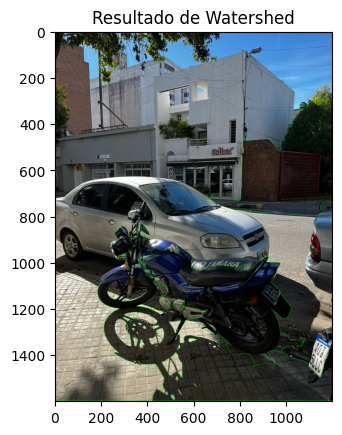

In [10]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

images = ['/content/WhatsApp Image 2024-04-19 at 11.11.41 (1).jpeg']

for image_path in images:
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)

    # Binarización de la imagen
    _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Eliminación de ruido
    kernel = np.ones((3,3), np.uint8)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

    # Seguro fondo área
    sure_bg = cv2.dilate(opening, kernel, iterations=3)

    # Encontrar área segura del frente
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.7*dist_transform.max(), 255, 0)

    # Encontrar región desconocida
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)

    # Etiquetado de marcadores
    _, markers = cv2.connectedComponents(sure_fg)

    # Añadir uno a todos los marcadores para asegurar que el fondo sea 1 en lugar de 0
    markers = markers+1

    # Marcar la región desconocida con cero
    markers[unknown==255] = 0

    # Aplicar el algoritmo Watershed
    markers = cv2.watershed(img, markers)
    img[markers == -1] = [0, 255, 0]

    # Visualizar el resultado
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Resultado de Watershed')
    plt.show()

Detectó la segmentación de la moto con contornos, pero al estar superpuesta a otro objeto, como el auto, no lo llega a detectar

In [11]:
%%capture
!pip install torchvision
import torch
model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
model.eval()

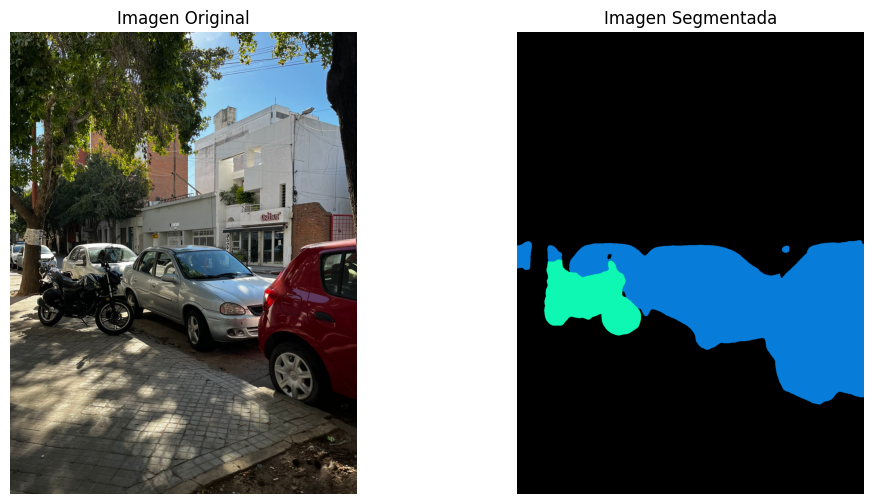

In [12]:
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
import torch

# Carga y procesa la imagen
input_image = Image.open("/content/WhatsApp Image 2024-04-19 at 11.11.41 (3).jpeg").convert("RGB").convert("RGB")

preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0)  # crea un mini-batch como espera el modelo

# Mueve el input y el modelo a GPU para mayor velocidad si está disponible
if torch.cuda.is_available():
    input_batch = input_batch.to('cuda')
    model.to('cuda')

with torch.no_grad():
    output = model(input_batch)['out'][0]
output_predictions = output.argmax(0)

# Crea una paleta de colores, seleccionando un color para cada clase
palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
colors = torch.as_tensor([i for i in range(21)])[:, None] * palette
colors = (colors % 255).numpy().astype("uint8")

# Genera la imagen de segmentación semántica
r = Image.fromarray(output_predictions.byte().cpu().numpy()).resize(input_image.size)
r.putpalette(colors)

# Muestra la imagen original y la segmentada lado a lado
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)  # 1 fila, 2 columnas, primer subplot
plt.imshow(input_image)
plt.title('Imagen Original')
plt.axis('off')  # Oculta los ejes

plt.subplot(1, 2, 2)  # 1 fila, 2 columnas, segundo subplot
plt.imshow(r)
plt.title('Imagen Segmentada')
plt.axis('off')  # Oculta los ejes

plt.show()

Se observa cómo una segmentación en bloques, separa la moto de los autos

In [13]:
%%capture
!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

!wget 'https://ultralytics.com/images/bus.jpg' -O bus.jpg

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 35.9/107.7 GB disk)



image 1/1 /content/WhatsApp Image 2024-04-19 at 11.11.41 (3).jpeg: 640x480 5 cars, 1 motorcycle, 1821.8ms
Speed: 5.8ms preprocess, 1821.8ms inference, 18.7ms postprocess per image at shape (1, 3, 640, 480)


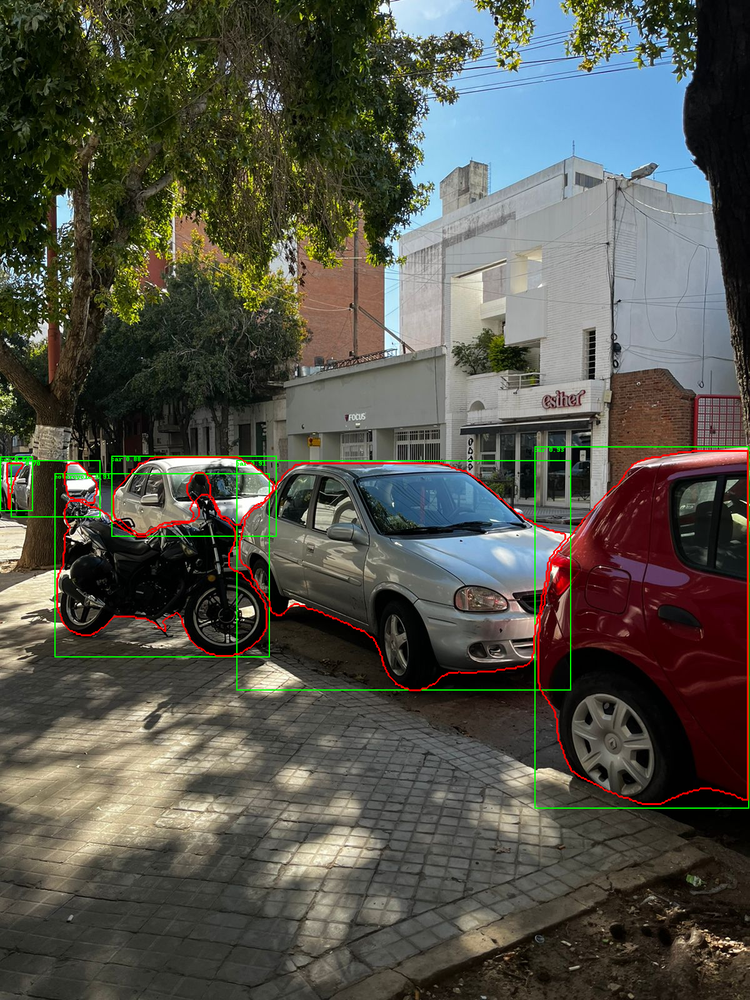

In [14]:
from ultralytics import YOLO
from PIL import Image, ImageDraw
import numpy as np
from IPython.display import display

# Cargar el modelo YOLOv8 con capacidad de segmentación
model = YOLO("yolov8m-seg.pt")

# Realizar predicciones en la imagen
results = model.predict('/content/WhatsApp Image 2024-04-19 at 11.11.41 (3).jpeg')

# Seleccionar el primer resultado (en caso de que haya varios)
result = results[0]

# Abrir la imagen original para dibujar sobre ella
img = Image.open("/content/WhatsApp Image 2024-04-19 at 11.11.41 (3).jpeg")
draw = ImageDraw.Draw(img)

# Para cada detección, dibujar el bounding box y mostrar la clase
for box in results[0].boxes:
    # Extracción de coordenadas del bounding box y clase
    x1, y1, x2, y2, conf, cls = box.data[0]
    label = result.names[int(cls)]  # Asumiendo que result.names contiene los nombres de las clases

    # Dibujar el bounding box
    draw.rectangle([x1, y1, x2, y2], outline=(0, 255, 0), width=2)

    # Mostrar la clase (y opcionalmente la confianza) en el bounding box
    text = f"{label} {conf:.2f}"
    draw.text((x1, y1), text, fill=(0, 255, 0))

# Acceder a las máscaras del resultado
masks = result.masks

# Iterar a través de todas las máscaras encontradas
for mask in masks:
    # Convertir la máscara a un array numpy y obtener el polígono
    mask_data = mask.data[0].numpy()
    polygon = mask.xy[0]

    # Dibujar el polígono correspondiente a cada máscara en la imagen original
    polygon_list = [(p[0], p[1]) for p in polygon]
    draw.polygon(polygon_list, outline=(255, 0, 0), width=3)

# Mostrar la imagen con los polígonos dibujados
display(img)

Se observa mucha mejor detección de los objetos por separado,aunque estén superpuestos.

In [15]:
%%capture
!pip install timm

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/models/detr/feature_extraction_detr.py:38: FutureWarning: The class DetrFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use DetrImageProcessor instead.
  warnings.warn(
Some weights of the model checkpoint at facebook/detr-resnet-50-panoptic were not used when initializing DetrForSegmentation: ['detr.model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'detr.mo

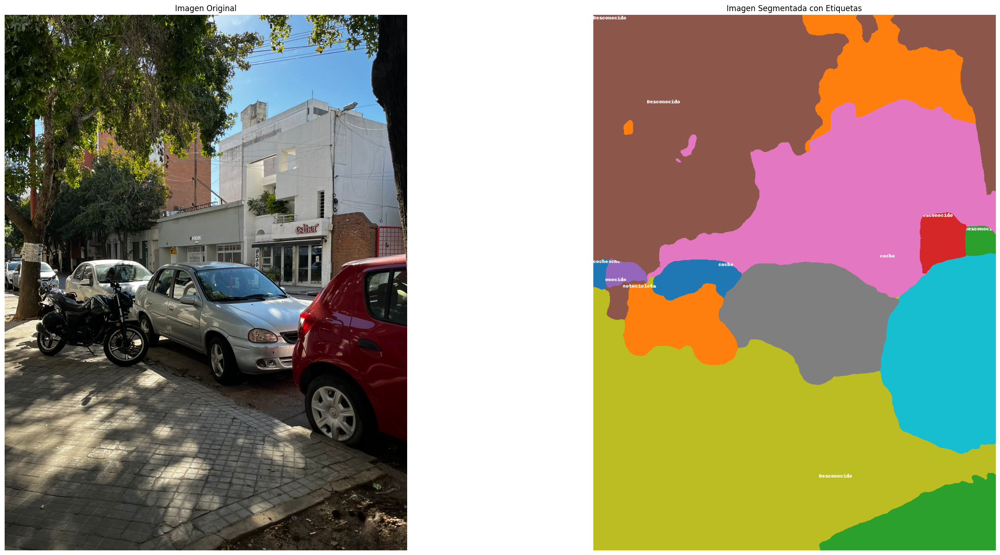

In [16]:
import io
from PIL import Image, ImageDraw
import torch
import numpy as np
import matplotlib.pyplot as plt
import itertools
import seaborn as sns
from transformers import DetrFeatureExtractor, DetrForSegmentation
from transformers.models.detr.feature_extraction_detr import rgb_to_id

# Cargar la imagen local
image_path = "/content/WhatsApp Image 2024-04-19 at 11.11.41 (3).jpeg"
image = Image.open(image_path)

# Cargar el modelo y el extractor de características
feature_extractor = DetrFeatureExtractor.from_pretrained("facebook/detr-resnet-50-panoptic")
model = DetrForSegmentation.from_pretrained("facebook/detr-resnet-50-panoptic")

# Preparar la imagen para el modelo
inputs = feature_extractor(images=image, return_tensors="pt")

# Paso forward
outputs = model(**inputs)

# Postprocesamiento
processed_sizes = torch.as_tensor(inputs["pixel_values"].shape[-2:]).unsqueeze(0)
result = feature_extractor.post_process_panoptic(outputs, processed_sizes, threshold=0.85)[0]

# Convertir la segmentación a numpy
panoptic_seg = Image.open(io.BytesIO(result["png_string"]))
panoptic_seg = np.array(panoptic_seg, dtype=np.uint8)
panoptic_seg_id = rgb_to_id(panoptic_seg)

# Preparar la paleta de colores
palette = itertools.cycle(sns.color_palette())

# Crear la imagen segmentada
segmented_image = Image.fromarray(np.zeros_like(panoptic_seg, dtype=np.uint8))
draw = ImageDraw.Draw(segmented_image)

# Mapeo manual de los IDs de las categorías a los nombres
COCO_LABELS = {
    1: 'persona', 2: 'bicicleta', 3: 'coche', 4: 'motocicleta', 5: 'avión',
    6: 'autobús', 7: 'tren', 8: 'camión', 9: 'barco', 10: 'semáforo',
    11: 'hidrante', 13: 'señal de stop', 14: 'parquímetro', 15: 'banco', 16: 'pájaro',
    17: 'gato', 18: 'perro', 19: 'caballo', 20: 'oveja', 21: 'vaca',
    22: 'elefante', 23: 'oso', 24: 'cebra', 25: 'jirafa', 27: 'mochila',
    28: 'paraguas', 31: 'bolso de mano', 32: 'corbata', 33: 'maleta', 34: 'frisbee',
    36: 'tabla de snowboard', 37: 'pelota deportiva', 38: 'cometa', 39: 'bate de béisbol',
    40: 'guante de béisbol', 41: 'patineta', 42: 'tabla de surf', 43: 'raqueta de tenis',
    44: 'botella', 46: 'plato de vino', 47: 'taza', 48: 'tenedor', 49: 'cuchillo',
    50: 'cuchara', 51: 'tazón', 52: 'banana', 53: 'manzana', 54: 'sándwich',
    55: 'naranja', 56: 'brócoli', 57: 'zanahoria', 58: 'perrito caliente', 59: 'pizza',
    60: 'donut', 61: 'pastel', 62: 'silla', 63: 'sofá', 64: 'maceta', 65: 'cama',
    67: 'mesa de comedor', 70: 'inodoro', 72: 'TV', 73: 'computadora portátil', 74: 'ratón',
    75: 'control remoto', 76: 'teclado', 77: 'teléfono celular', 78: 'microondas',
    79: 'horno', 80: 'tostadora', 81: 'fregadero', 82: 'refrigerador', 84: 'libro',
    85: 'reloj', 86: 'florero', 87: 'tijeras', 88: 'oso de peluche', 89: 'secador de pelo',
    90: 'cepillo de dientes',
}

# Dibujar los segmentos y etiquetas
for segment_info in result["segments_info"]:
    class_id = segment_info["category_id"]
    class_name = COCO_LABELS.get(class_id, 'Desconocido')  # 'Desconocido' si el ID no está en el diccionario
    id = segment_info["id"]

    # Generar la máscara para este segmento específico
    mask = panoptic_seg_id == id
    color = np.array(next(palette)) * 255  # Convertir el color a un array de numpy adecuado

    # Convertir la máscara a una imagen de PIL para usarla como máscara en 'paste'
    mask_image = Image.fromarray((mask * 255).astype(np.uint8))

    # Crear una imagen del color del segmento que tenga las dimensiones correctas
    color_image = Image.new("RGB", segmented_image.size, color=tuple(color.astype(int)))

    # Pegar usando la máscara para aplicar solo este segmento
    segmented_image.paste(color_image, (0,0), mask=mask_image)

    # Dibujar el nombre de la clase en la posición inicial del segmento
    draw = ImageDraw.Draw(segmented_image)
    where = np.where(mask)
    if where[0].size > 0 and where[1].size > 0:
        x, y = np.min(where[1]), np.min(where[0])
        draw.text((x, y), class_name, fill='white')

# Mostrar la imagen original y la segmentada
plt.figure(figsize=(30, 15))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Imagen Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmented_image)
plt.title('Imagen Segmentada con Etiquetas')
plt.axis('off')

plt.show()


Agarra partes del fondo cómo objeto, pone etiquetas a los objetos que puede reconocer.

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


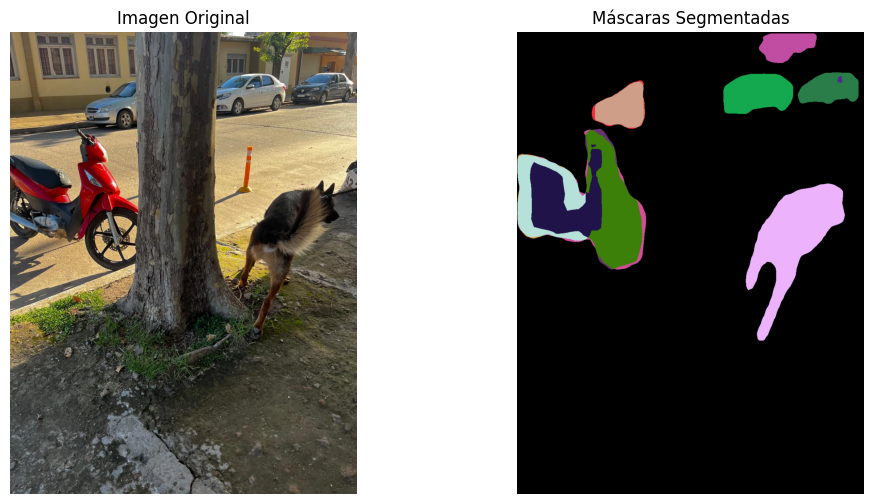

In [17]:
import torch
import torchvision.transforms as T
from torchvision.models.detection import maskrcnn_resnet50_fpn
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Descargar el modelo preentrenado Mask R-CNN
model = maskrcnn_resnet50_fpn(pretrained=True)
model.eval()

# Transformación de preprocesamiento para la imagen
transform = T.Compose([T.ToTensor()])

# Cargar y preprocesar la imagen
image_path = '/content/WhatsApp Image 2024-04-20 at 13.25.22.jpeg'
image = Image.open(image_path).convert("RGB")
image_tensor = transform(image)

# Realizar la inferencia
with torch.no_grad():
    prediction = model([image_tensor])

# Obtener las máscaras y las cajas del resultado de la predicción
masks = prediction[0]['masks']
boxes = prediction[0]['boxes'].detach().cpu().numpy()

# Convertir las máscaras a una imagen numpy
masks = (masks > 0.5).squeeze().detach().cpu().numpy()

# Visualizar la imagen original y las máscaras segmentadas
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Mostrar la imagen original
ax1.imshow(image)
ax1.axis('off')
ax1.set_title('Imagen Original')

# Mostrar las máscaras segmentadas sobre la imagen original
segmented_image = np.zeros_like(image)

# Iterar sobre las máscaras y aplicarlas a la imagen segmentada
for i, mask in enumerate(masks):
    color = np.random.rand(3)  # Generar un color aleatorio para cada máscara
    segmented_image[:, :, 0] += np.where(mask, color[0] * 255, 0).astype(np.uint8)
    segmented_image[:, :, 1] += np.where(mask, color[1] * 255, 0).astype(np.uint8)
    segmented_image[:, :, 2] += np.where(mask, color[2] * 255, 0).astype(np.uint8)

# Asegurarse de que los valores de píxeles no excedan 255
segmented_image = np.clip(segmented_image, 0, 255)

ax2.imshow(segmented_image.astype(np.uint8))
ax2.axis('off')
ax2.set_title('Máscaras Segmentadas')

plt.show()


Separa y segmenta bastante bien los objetos por no estar superpuestos.


image 1/1 /content/WhatsApp Image 2024-04-20 at 13.25.22.jpeg: 640x480 3 cars, 1 motorcycle, 1 dog, 3649.9ms
Speed: 3.4ms preprocess, 3649.9ms inference, 87.5ms postprocess per image at shape (1, 3, 640, 480)


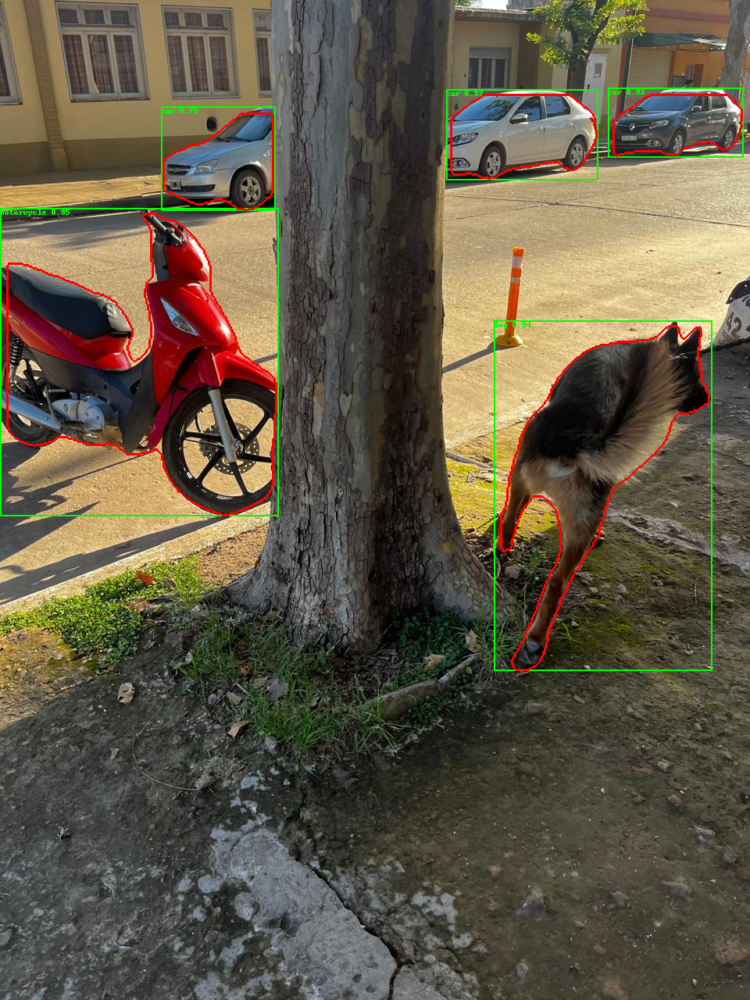

In [18]:
from ultralytics import YOLO
from PIL import Image, ImageDraw
import numpy as np
from IPython.display import display

# Cargar el modelo YOLOv8 con capacidad de segmentación
model = YOLO("yolov8m-seg.pt")

# Realizar predicciones en la imagen
results = model.predict('/content/WhatsApp Image 2024-04-20 at 13.25.22.jpeg')

# Seleccionar el primer resultado (en caso de que haya varios)
result = results[0]

# Abrir la imagen original para dibujar sobre ella
img = Image.open("/content/WhatsApp Image 2024-04-20 at 13.25.22.jpeg")
draw = ImageDraw.Draw(img)

# Para cada detección, dibujar el bounding box y mostrar la clase
for box in results[0].boxes:
    # Extracción de coordenadas del bounding box y clase
    x1, y1, x2, y2, conf, cls = box.data[0]
    label = result.names[int(cls)]  # Asumiendo que result.names contiene los nombres de las clases

    # Dibujar el bounding box
    draw.rectangle([x1, y1, x2, y2], outline=(0, 255, 0), width=2)

    # Mostrar la clase (y opcionalmente la confianza) en el bounding box
    text = f"{label} {conf:.2f}"
    draw.text((x1, y1), text, fill=(0, 255, 0))

# Acceder a las máscaras del resultado
masks = result.masks

# Iterar a través de todas las máscaras encontradas
for mask in masks:
    # Convertir la máscara a un array numpy y obtener el polígono
    mask_data = mask.data[0].numpy()
    polygon = mask.xy[0]

    # Dibujar el polígono correspondiente a cada máscara en la imagen original
    polygon_list = [(p[0], p[1]) for p in polygon]
    draw.polygon(polygon_list, outline=(255, 0, 0), width=3)

# Mostrar la imagen con los polígonos dibujados
display(img)

##Conclusión ejercicio 9:

La elección del método de segmentación depende en gran medida de la complejidad de la imagen y la naturaleza de los objetos presentes.
En imágenes superpuestas, como en este caso la de la moto con los autos atrás , la segmentación ofrece la capacidad de identificar y separar objetos individuales con alta precisión.
En imágenes no superpuestas, como la del perro, los enfoques como la segmentación semántica o basada en contornos proporcionan  resultados más efectivos.